In [1]:
import numpy as np
import pandas as pd
import math
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.mplot3d import axes3d
import seaborn as sns
#%matplotlib notebook
sns.set()
import os
import time
import random
import pygraphviz as pgv
import cvxpy as cp
import scipy as scipy
import statistics as statc
from scipy.spatial import KDTree
import random
import json

In [2]:
import math
# Generate points in circle
pi = math.pi
def PointsInCircum(r,n):
    l=[((math.cos(2*pi/n*x)*r)+600,(math.sin(2*pi/n*x)*r)+600) for x in range(0,n)]
    return l

In [3]:
##time series on node coordinates

N=40 #number of nodes
M_nd=2*N #multiplied by 2 because of x and y coordinated for each node
X_nd=np.empty((M_nd,0)) #this will the system series for nodes
MUs_nd=np.empty((M_nd,0))
Y_nd=np.empty((M_nd,0)) #this will the observed series for nodes
Y_nd=np.append(Y_nd,np.zeros((M_nd,1)),axis=1)

l = np.array(PointsInCircum(400, M_nd))
m=0
L=np.empty((M_nd,1))
for i in range(0,M_nd,2):
    L[i]=l[m,0]
    L[i+1]=l[m,1]
    m=m+1
    
X_nd=np.append(X_nd,L,axis=1) #initializing node positions at 0th time point


t=1000 #time points

# assign parameter values to your liking
# C=0.95*np.eye(M)+0.01*np.random.normal(0, 1,(M,M))
C_nd=np.eye(M_nd)
# D_nd=1.1*np.eye(M_nd)+0.2*np.random.normal(0, 1,(M_nd,M_nd))
random.seed(89)
D_nd=np.eye(M_nd)+3*np.random.normal(0, 0.01,(M_nd,M_nd))
# D_nd=np.eye(M_nd)
Gam_nd=1*np.eye(M_nd)
sigsq1_nd=100
Q_nd=sigsq1_nd*np.eye(M_nd)
# Q=0.2*np.random.normal(0, 1,(M,M))+np.eye(M)
sigsq2_nd=10 #10 #0.1
Lam_nd=sigsq2_nd*np.eye(M_nd)
random.seed(65)

#generate series
MUs_nd=np.append(MUs_nd,np.array([np.random.multivariate_normal(np.zeros(M_nd), Q_nd)]).T,axis=1)
Xprev_nd=X_nd.copy()
mu_nd=MUs_nd.copy()
for i in range(t):
    Xnew_nd=np.dot(C_nd,Xprev_nd)+mu_nd #+np.dot(Gam,mu)
    X_nd=np.append(X_nd,Xnew_nd,axis=1)
    random.seed(i+86)
    w_nd=np.array([np.random.multivariate_normal(np.zeros(M_nd), Lam_nd)]).T
    Ynew_nd=np.dot(D_nd,Xnew_nd)+w_nd
    Y_nd=np.append(Y_nd,Ynew_nd,axis=1)
    Xprev_nd=Xnew_nd.copy()
    random.seed(i+59)
    mu_nd=np.array([np.random.multivariate_normal(np.zeros(M_nd), Q_nd)]).T
    MUs_nd=np.append(MUs_nd,mu_nd,axis=1)
    
print(X_nd.shape)
print(Y_nd.shape)

(80, 1001)
(80, 1001)


In [62]:
# make 4 chosen nodes enter and exit the scene over time to add realistic complexity
nc=[7,8,9,6]
# modification in X series (system)
X_nd[nc[0]*2:(nc[0]*2)+2,400:]=0  #nc[0] exits at 400
X_nd[nc[1]*2:(nc[1]*2)+2,:150]=0 #nc[1] enters at 150
X_nd[nc[2]*2:(nc[2]*2)+2,:200]=0 #nc[2] enters at 200
X_nd[nc[2]*2:(nc[2]*2)+2,300:450]=0 #nc[2] exits at 300, returns at 450
X_nd[nc[3]*2:(nc[3]*2)+2,280:420]=0 #nc[3] exits at 280, returns at 420
# modification in Y series (observed)
Y_nd[nc[0]*2:(nc[0]*2)+2,400:]=0
Y_nd[nc[1]*2:(nc[1]*2)+2,:150]=0
Y_nd[nc[2]*2:(nc[2]*2)+2,:200]=0
Y_nd[nc[2]*2:(nc[2]*2)+2,300:450]=0
Y_nd[nc[3]*2:(nc[3]*2)+2,280:420]=0

In [63]:
# make some nodes unobserved in Y series to simulate missed object detections
t_missed=random.sample(range(t),50) #choose time points for missed detections
n_missed=random.choices([1,2],k=50) 
for t in range(len(t_missed)):
    n_drop=n_missed[t] #number of nodes unobsereved at time t
    nds_drop=random.sample(range(N),n_drop) #choose unobsereved nodes randomly
    for nd in nds_drop:
        Y_nd[nd*2:(nd*2)+2,t_missed[t]]=0 #remove chosen nodes from detections

In [69]:
Xk_nd =np.empty((M_nd,1))
Xk_nd[:,0]=Y_nd[:,0]
P_nd = np.empty((M_nd,M_nd,t+1))
P_nd[:,:,0]=np.eye(M_nd)*10
for i in range(1,t+1):
    Xp_nd = C_nd@Xk_nd[:,i-1].reshape((M_nd,1))
    PE_nd= C_nd@P_nd[:,:,i-1]@C_nd.T+Q_nd
    pinv_nd = np.linalg.inv(D_nd@PE_nd@D_nd.T+Lam_nd)
    Kk = PE_nd@D_nd@pinv_nd
    P_nd[:,:,i]=(np.eye(M_nd)-Kk@D_nd)@PE_nd
    Xknew_nd = Xp_nd+Kk@(Y_nd[:,i].reshape(M_nd,1)-D_nd@Xp_nd)
    Xk_nd = np.append(Xk_nd,Xknew_nd,axis=1)

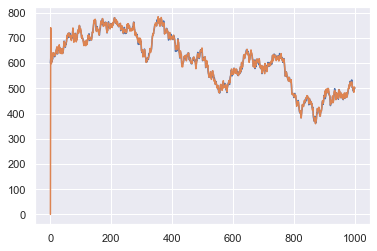

In [73]:
plt.plot(X_nd[1,:])
plt.plot(Xk_nd[1,:])

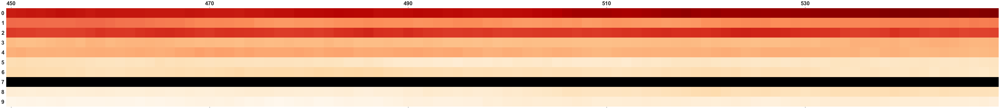

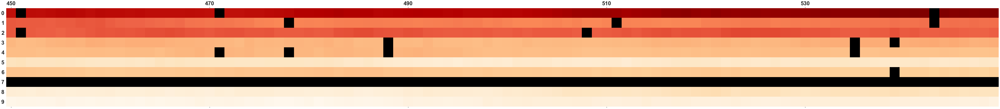

In [6]:
## This cell is only fot plotting/visualization purposes

X_nd_plot=np.delete(X_nd, range(1, X_nd.shape[0], 2), axis=0)
Y_nd_plot=np.delete(Y_nd, range(1, Y_nd.shape[0], 2), axis=0)
X_nd_plot=X_nd_plot[:,1:]
Y_nd_plot=Y_nd_plot[:,1:]

# mask some data where there are no detections (node has not entered/has left/was not detected)
X_nd_plot = np.ma.masked_where(X_nd_plot==0, X_nd_plot)
Y_nd_plot = np.ma.masked_where(Y_nd_plot==0, Y_nd_plot)

# view a section of the times series
strt=450
end=550
view_t=list(range(strt,end))
view_t_lab=list(range(strt,end,20))
view_t_loc=[0,20,40,60,80]

#X series
fig=plt.figure(figsize = (100,10))
plt.rcParams["axes.grid"] = False
ax2=plt.axes()
ax2.set_facecolor('white')
cmap = mpl.cm.get_cmap("OrRd")
cmap.set_bad(color='black')
h=ax2.matshow(X_nd_plot[:,view_t],cmap = cmap)
plt.xticks(view_t_loc,view_t_lab,fontsize=30,weight= 'bold' )
plt.xticks(fontsize=30,weight= 'bold' )
plt.yticks(list(range(N)),list(range(N)),fontsize=30,weight= 'bold' )
plt.show()

#Y series
fig=plt.figure(figsize = (100,10))
plt.rcParams["axes.grid"] = False
ax2=plt.axes()
ax2.set_facecolor('white')
cmap = mpl.cm.get_cmap("OrRd")
cmap.set_bad(color='black')
h=ax2.matshow(Y_nd_plot[:,view_t],cmap = cmap)
plt.xticks(view_t_loc,view_t_lab,fontsize=30,weight= 'bold' )
plt.yticks(list(range(N)),list(range(N)),fontsize=30,weight= 'bold' )
plt.show()

# rows are nodes, columns are time points,
# for each node, color changes over time denote movement of the node 
# black locations denote that node was not detected at that time point (node has not entered/has left/was not detected)


In [4]:
##time series on edges
N=40
M=int(N*(N-1)/2) #number of unique edges, since the graph is symmetric

X=np.empty((M,0)) #this will the system series for edges
MUs=np.empty((M,0))
Y=np.empty((M,0)) #this will the observed series for edges
Y=np.append(Y,np.zeros((M,1)),axis=1)
random.seed(42)
X=np.append(X,np.random.rand(M,1),axis=1) #initializing edge weights at 0th time point
ind = np.random.choice(780,int(0.8*780),replace=False)
X[ind,0]=0
t=1000 #time points

# assign parameter values to your liking
#C=0.95*np.eye(M)+0.01*np.random.normal(0, 1,(M,M))
C=0.95*np.eye(M)
#D=2*np.eye(M)+0.1*np.random.normal(0, 1,(M,M))
random.seed(32)
D=np.eye(M)+0.001*np.random.normal(0, 1,(M,M))
# D=np.eye(M)
Gam=1*np.eye(M)
sigsq1=1 #1
Q=sigsq1*np.eye(M)
#Q=0.2*np.random.normal(0, 1,(M,M))+np.eye(M)
sigsq2=0.01 #0.01
Lam=sigsq2*np.eye(M)
random.seed(54)

#generate series
MUs=np.append(MUs,np.array([np.random.multivariate_normal(np.zeros(M), Q)]).T,axis=1)
Xprev=X.copy()
mu=MUs.copy()
for i in range(t): 
    Xnew=np.dot(C,Xprev)+mu #+np.dot(Gam,mu)
    Xnew[Xnew<1e-5]=0
    X=np.append(X,Xnew,axis=1)
    random.seed(i+23)
    w=np.array([np.random.multivariate_normal(np.zeros(M), Lam)]).T
    Ynew=np.dot(D,Xnew)+w
    Y=np.append(Y,Ynew,axis=1)
    Xprev=Xnew.copy()
    random.seed(i+76)
    mu=np.array([np.random.multivariate_normal(np.zeros(M), Q)]).T
    MUs=np.append(MUs,mu,axis=1)
    
print(X.shape)
print(Y.shape)

(780, 1001)
(780, 1001)


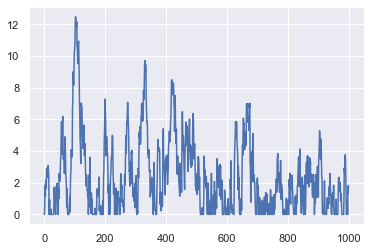

In [5]:
plt.plot(X[0,:t])

In [76]:
P = np.empty((M,M,t+1))
P[:,:,0]=np.eye(M)*10
PE = np.empty((M,M,t))
PE=C@P[:,:,0]@C.T+Q
SK=D@PE@D.T+Lam
SK[SK<1e-3]=0

In [7]:
import SCIS_ALM as alm  

In [8]:
opts = alm.Opts(mxitr = 500,mu0=1e-1,muf=1e-3,rmu=1/8,
    tol_gap=1e-1,tol_frel=1e-7,tol_Xrel=1e-7,tol_Yrel=1e-7,numDG=10,record=1,sigma=1e-10)
out = alm.SCIS_ALM(SK,1e-9,opts)

In [17]:
def check_symmetric(a, rtol=1e-05, atol=1e-08):
    return np.allclose(a, a.T, rtol=rtol, atol=atol)
check_symmetric(SK)

True

In [95]:
from scipy.linalg import cholesky, inv, cho_factor, cho_solve

In [109]:
scipy.sparse.issparse(scipy.sparse.bsr_matrix(SK))

True

In [103]:
SK_S = scipy.sparse.csc_matrix(SK)
L,U = scipy.sparse.linalg.eigsh(SK_S)


(780, 6)

In [108]:
run_sinv = []
for i in range(1000):
    st = time.time()
    if i%10 ==0:
        L,U = scipy.sparse.linalg.eigsh(SK_S)
        Linv = np.diag(1/L)
        sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    else:
        L = np.matmul(np.matmul(U.T,SK),U)
        Linv = np.diag(1/np.diag(L))  
        sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    et = time.time()
    run_sinv.append(et-st)
print('{0}ms+{1}ms'.format(np.mean(run_sinv)*1000,np.std(run_sinv*1000)))

8.408351421356201ms+0.022106970639255947ms


In [105]:
run_ch = []
for i in range(1000):
    st = time.time()
    np.linalg.inv(SK)
    et = time.time()
    run_ch.append(et-st)
print('{0}ms+{1}ms'.format(np.mean(run_ch)*1000,np.std(run_ch*1000)))

12.392188787460327ms+0.0012174182671528056ms


In [58]:
print(np.mean(np.abs(y@(y_inv@z)-z)))
print(np.mean(np.abs(y@(y_lu@z)-z)))


1.171617336481745e-11
1.1379533582100976e-11


In [111]:
run_lu = []
for i in range(1000):
    st = time.time()
    if i%10 ==0:
        L,U = np.linalg.eigh(SK)
        Linv = np.diag(1/L)
        sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    else:
        L = np.matmul(np.matmul(U.T,SK),U)
        Linv = np.diag(1/np.diag(L))
    
    et = time.time()
    run_lu.append(et-st)
print('{0}ms+{1}ms'.format(np.mean(run_lu)*1000,np.std(run_lu*1000)))

15.920255422592163ms+0.012808424240997275ms


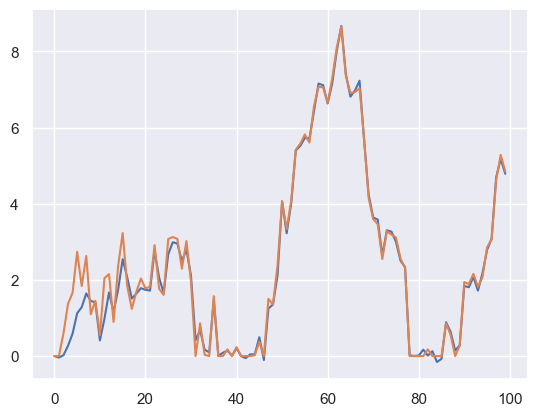

0.020463180060338492
0.005034877796365757
0.0301887338811701


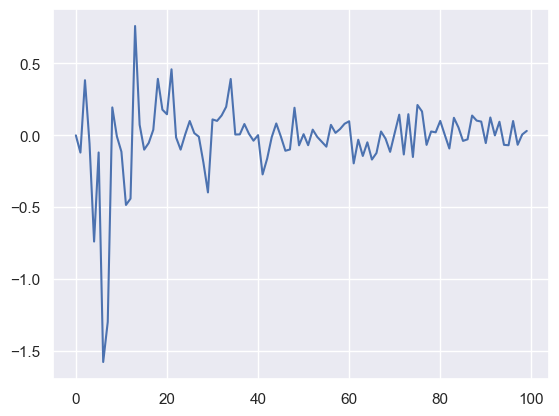

In [10]:
P = np.empty((M,M,t+1))
Xk =np.empty((M,1))
Xk[:,0]=Y[:,0]
P[:,:,0]=np.eye(M)*10
C_s = scipy.sparse.csc_matrix(C)
D_s = scipy.sparse.csc_matrix(D)
dift1 = []
dift2 = []
dift3 = []
dift4 = []
for i in range(1,100):
    st1 = time.time()
    Xp = C_s@Xk[:,i-1].reshape((M,1))
    PE= C_s@P[:,:,i-1]@C_s.T+Q 
    SK =D@PE@D.T+Lam
    st2 = time.time()
    if i%10 == 0 or i==1:
        L,U = np.linalg.eigh(SK)
        Linv = np.diag(1/L)
        sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    # else:
    #     L = np.matmul(np.matmul(U.T,SK),U)
    #     Linv = np.diag(1/np.diag(L))
    
    et1 = time.time()
    
    # sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    
    Kk = np.matmul( np.matmul(PE,D.T),sk_inv)
    
    P[:,:,i]=np.matmul((np.eye(M)-np.matmul(Kk,D)),PE)
    
    Xknew = Xp+np.matmul(Kk,(Y[:,i].reshape(M,1)-np.matmul(D,Xp)))
    zt = time.time()
    Xk = np.append(Xk,Xknew,axis=1)
    dift1 = np.append(dift1,st2-st1)
    dift2 = np.append(dift2,et1-st2)
    dift3 = np.append(dift3,zt-et1)
    


plt.plot(Xk[3,:100])
plt.plot(X[3,:100])
plt.show()
plt.plot(Xk[1,:100]-X[1,:100])
print(np.mean(dift1))
print(np.mean(dift2))
print(np.mean(dift3))

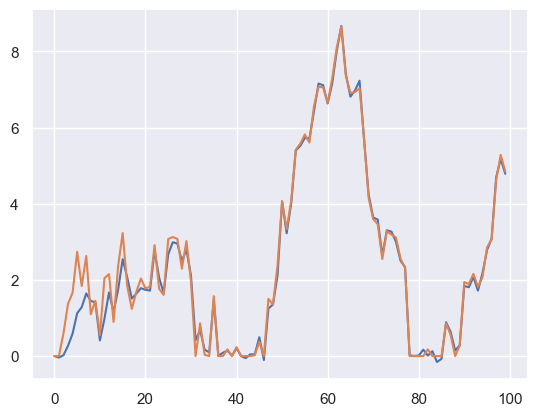

2.728500585363369
0.00496410360239973
0.03030025838601469


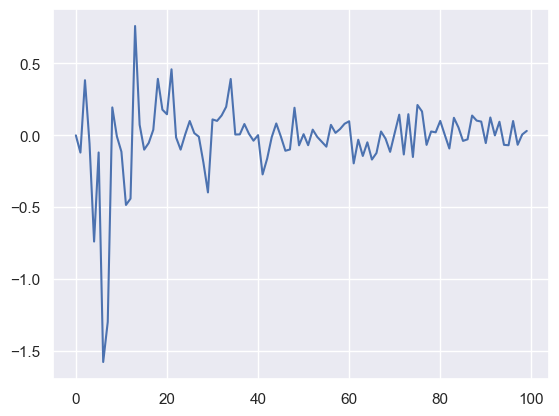

In [11]:
P = np.empty((M,M,t+1))
Xk =np.empty((M,1))
Xk[:,0]=Y[:,0]
P[:,:,0]=np.eye(M)*10
dift1 = []
dift2 = []
dift3 = []
dift4 = []
for i in range(1,100):
    st1 = time.time()
    Xp = np.matmul(C,Xk[:,i-1].reshape((M,1)))
    PE= np.matmul(np.matmul(C,P[:,:,i-1]),C.T)+Q
    SK =np.matmul(np.matmul(D,PE),D.T)+Lam
    st2 = time.time()
    if i%10 == 0 or i==1:
        L,U = np.linalg.eigh(SK)
        Linv = np.diag(1/L)
        sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    # else:
    #     L = np.matmul(np.matmul(U.T,SK),U)
    #     Linv = np.diag(1/np.diag(L))
    
    et1 = time.time()
    
    # sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    
    Kk = np.matmul( np.matmul(PE,D.T),sk_inv)
    
    P[:,:,i]=np.matmul((np.eye(M)-np.matmul(Kk,D)),PE)
    
    Xknew = Xp+np.matmul(Kk,(Y[:,i].reshape(M,1)-np.matmul(D,Xp)))
    zt = time.time()
    Xk = np.append(Xk,Xknew,axis=1)
    dift1 = np.append(dift1,st2-st1)
    dift2 = np.append(dift2,et1-st2)
    dift3 = np.append(dift3,zt-et1)
    


plt.plot(Xk[3,:100])
plt.plot(X[3,:100])
plt.show()
plt.plot(Xk[1,:100]-X[1,:100])
print(np.mean(dift1))
print(np.mean(dift2))
print(np.mean(dift3))

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
0.013517261731742633


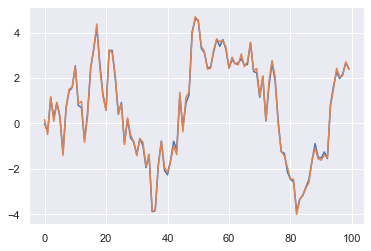

-0.00487447553719335


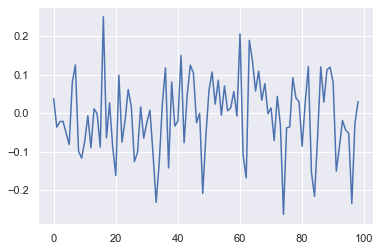

In [59]:
P = np.empty((M,M,t+1))
Xk_o =np.empty((M,1))
Xk_o[:,0]=Y[:,0]
P[:,:,0]=np.eye(M)*10
for i in range(1,100):
    print(i)
    Xp = np.matmul(C,Xk[:,i-1].reshape((M,1)))
    PE= np.matmul(np.matmul(C,P[:,:,i-1]),C.T)+Q
    SK =D@PE@D.T+Lam
    ot = time.time()
    sk_inv = np.linalg.inv(SK)
    ht = time.time()
    Kk = np.matmul( np.matmul(PE,D.T),sk_inv)
    
    P[:,:,i]=np.matmul((np.eye(M)-np.matmul(Kk,D)),PE)
    
    Xknew = Xp+np.matmul(Kk,(Y[:,i].reshape(M,1)-np.matmul(D,Xp)))
    Xk_o = np.append(Xk_o,Xknew,axis=1)
    dift2 = np.append(dift2,ht-ot)
print(np.mean(dift2))
plt.plot(Xk_o[3,:100])
plt.plot(X[3,:100])
plt.show()
plt.plot(Xk_o[1,1:100]-X[1,1:100])
print(np.mean(Xk_o[:,:100]-X[:,:100]))

In [14]:
P = np.empty((M,M,t+1))
Xk =np.empty((M,1))
Xk[:,0]=Y[:,0]
P[:,:,0]=np.eye(M)*10
C_s = scipy.sparse.csc_matrix(C)
D_s = scipy.sparse.csc_matrix(D)
dift1 = []
dift2 = []
dift3 = []
dift4 = []
for i in range(1,100):
    st1 = time.time()
    Xp = C_s@Xk[:,i-1].reshape((M,1))
    PE= C_s@P[:,:,i-1]@C_s.T+Q 
    SK =D@PE@D.T+Lam
    st2 = time.time()
    if i%10 == 0 or i==1:
        L,U = np.linalg.eigh(SK)
        Linv = np.diag(1/L)
        sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    # else:
    #     L = np.matmul(np.matmul(U.T,SK),U)
    #     Linv = np.diag(1/np.diag(L))
    
    et1 = time.time()
    
    # sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    
    Kk = np.matmul( np.matmul(PE,D.T),sk_inv)
    
    P[:,:,i]=np.matmul((np.eye(M)-np.matmul(Kk,D)),PE)
    
    Xknew = Xp+np.matmul(Kk,(Y[:,i].reshape(M,1)-np.matmul(D,Xp)))
    zt = time.time()
    Xk = np.append(Xk,Xknew,axis=1)
    dift1 = np.append(dift1,st2-st1)
    dift2 = np.append(dift2,et1-st2)
    dift3 = np.append(dift3,zt-et1)
    


# plt.plot(Xk[3,:100])
# plt.plot(X[3,:100])
# plt.show()
# plt.plot(Xk[1,:100]-X[1,:100])
print(np.mean(dift1))
print(np.mean(dift2))
print(np.mean(dift3))

0.02060482959554653
0.004772010475698143
0.03045159638530076


In [15]:
##time series on edges
N=40
M=int(N*(N-1)/2) #number of unique edges, since the graph is symmetric

X=np.empty((M,0)) #this will the system series for edges
MUs=np.empty((M,0))
Y=np.empty((M,0)) #this will the observed series for edges
Y=np.append(Y,np.zeros((M,1)),axis=1)
random.seed(42)
X=np.append(X,np.random.rand(M,1),axis=1) #initializing edge weights at 0th time point
# ind = np.random.choice(780,int(0.3*780),replace=False)
# X[ind,0]=0
t=1000 #time points

# assign parameter values to your liking
#C=0.95*np.eye(M)+0.01*np.random.normal(0, 1,(M,M))
C=0.95*np.eye(M)
#D=2*np.eye(M)+0.1*np.random.normal(0, 1,(M,M))
random.seed(32)
D=np.eye(M)+0.001*np.random.normal(0, 1,(M,M))
# D=np.eye(M)
Gam=1*np.eye(M)
sigsq1=1 #1
Q=sigsq1*np.eye(M)
#Q=0.2*np.random.normal(0, 1,(M,M))+np.eye(M)
sigsq2=0.01 #0.01
Lam=sigsq2*np.eye(M)
random.seed(54)

#generate series
MUs=np.append(MUs,np.array([np.random.multivariate_normal(np.zeros(M), Q)]).T,axis=1)
Xprev=X.copy()
mu=MUs.copy()
for i in range(t): 
    Xnew=np.dot(C,Xprev)+mu #+np.dot(Gam,mu)
    Xnew[Xnew<1e-5]=0
    X=np.append(X,Xnew,axis=1)
    random.seed(i+23)
    w=np.array([np.random.multivariate_normal(np.zeros(M), Lam)]).T
    Ynew=np.dot(D,Xnew)+w
    Y=np.append(Y,Ynew,axis=1)
    Xprev=Xnew.copy()
    random.seed(i+76)
    mu=np.array([np.random.multivariate_normal(np.zeros(M), Q)]).T
    MUs=np.append(MUs,mu,axis=1)
    
print(X.shape)
print(Y.shape)

(780, 1001)
(780, 1001)


In [16]:
P = np.empty((M,M,t+1))
Xk =np.empty((M,1))
Xk[:,0]=Y[:,0]
P[:,:,0]=np.eye(M)*10
C_s = scipy.sparse.csc_matrix(C)
D_s = scipy.sparse.csc_matrix(D)
dift1 = []
dift2 = []
dift3 = []
dift4 = []
for i in range(1,100):
    st1 = time.time()
    Xp = C_s@Xk[:,i-1].reshape((M,1))
    PE= C_s@P[:,:,i-1]@C_s.T+Q 
    SK =D@PE@D.T+Lam
    st2 = time.time()
    if i%10 == 0 or i==1:
        L,U = np.linalg.eigh(SK)
        Linv = np.diag(1/L)
        sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    # else:
    #     L = np.matmul(np.matmul(U.T,SK),U)
    #     Linv = np.diag(1/np.diag(L))
    
    et1 = time.time()
    
    # sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    
    Kk = np.matmul( np.matmul(PE,D.T),sk_inv)
    
    P[:,:,i]=np.matmul((np.eye(M)-np.matmul(Kk,D)),PE)
    
    Xknew = Xp+np.matmul(Kk,(Y[:,i].reshape(M,1)-np.matmul(D,Xp)))
    zt = time.time()
    Xk = np.append(Xk,Xknew,axis=1)
    dift1 = np.append(dift1,st2-st1)
    dift2 = np.append(dift2,et1-st2)
    dift3 = np.append(dift3,zt-et1)
    


# plt.plot(Xk[3,:100])
# plt.plot(X[3,:100])
# plt.show()
# plt.plot(Xk[1,:100]-X[1,:100])
print(np.mean(dift1))
print(np.mean(dift2))
print(np.mean(dift3))

0.02046299944020281
0.0049439054546934185
0.02983511577952992


In [23]:
##time series on edges
N=40
M=int(N*(N-1)/2) #number of unique edges, since the graph is symmetric

X=np.empty((M,0)) #this will the system series for edges
MUs=np.empty((M,0))
Y=np.empty((M,0)) #this will the observed series for edges
Y=np.append(Y,np.zeros((M,1)),axis=1)
random.seed(42)
X=np.append(X,np.random.rand(M,1),axis=1) #initializing edge weights at 0th time point
# ind = np.random.choice(780,int(0.3*780),replace=False)
# X[ind,0]=0
t=1000 #time points

# assign parameter values to your liking
C=0.95*np.eye(M)+0.01*np.random.normal(0, 1,(M,M))
ind = np.random.choice(780,int(0.3*780),replace=False)
C[ind,0]=0
#C=0.95*np.eye(M)
#D=2*np.eye(M)+0.1*np.random.normal(0, 1,(M,M))
random.seed(32)
D=np.eye(M)+0.001*np.random.normal(0, 1,(M,M))
# D=np.eye(M)
Gam=1*np.eye(M)
sigsq1=1 #1
Q=sigsq1*np.eye(M)
#Q=0.2*np.random.normal(0, 1,(M,M))+np.eye(M)
sigsq2=0.01 #0.01
Lam=sigsq2*np.eye(M)
random.seed(54)

#generate series
MUs=np.append(MUs,np.array([np.random.multivariate_normal(np.zeros(M), Q)]).T,axis=1)
Xprev=X.copy()
mu=MUs.copy()
for i in range(t): 
    Xnew=np.dot(C,Xprev)+mu #+np.dot(Gam,mu)
    Xnew[Xnew<1e-5]=0
    X=np.append(X,Xnew,axis=1)
    random.seed(i+23)
    w=np.array([np.random.multivariate_normal(np.zeros(M), Lam)]).T
    Ynew=np.dot(D,Xnew)+w
    Y=np.append(Y,Ynew,axis=1)
    Xprev=Xnew.copy()
    random.seed(i+76)
    mu=np.array([np.random.multivariate_normal(np.zeros(M), Q)]).T
    MUs=np.append(MUs,mu,axis=1)
    
print(X.shape)
print(Y.shape)
P = np.empty((M,M,t+1))
Xk =np.empty((M,1))
Xk[:,0]=Y[:,0]
P[:,:,0]=np.eye(M)*10
C_s = scipy.sparse.csc_matrix(C)
D_s = scipy.sparse.csc_matrix(D)
dift1 = []
dift2 = []
dift3 = []
dift4 = []
for i in range(1,100):
    st1 = time.time()
    Xp = C_s@Xk[:,i-1].reshape((M,1))
    PE= C_s@P[:,:,i-1]@C_s.T+Q 
    SK =D@PE@D.T+Lam
    st2 = time.time()
    if i%10 == 0 or i==1:
        L,U = np.linalg.eigh(SK)
        Linv = np.diag(1/L)
        sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    # else:
    #     L = np.matmul(np.matmul(U.T,SK),U)
    #     Linv = np.diag(1/np.diag(L))
    
    et1 = time.time()
    
    # sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    
    Kk = np.matmul( np.matmul(PE,D.T),sk_inv)
    
    P[:,:,i]=np.matmul((np.eye(M)-np.matmul(Kk,D)),PE)
    
    Xknew = Xp+np.matmul(Kk,(Y[:,i].reshape(M,1)-np.matmul(D,Xp)))
    zt = time.time()
    Xk = np.append(Xk,Xknew,axis=1)
    dift1 = np.append(dift1,st2-st1)
    dift2 = np.append(dift2,et1-st2)
    dift3 = np.append(dift3,zt-et1)
    


# plt.plot(Xk[3,:100])
# plt.plot(X[3,:100])
# plt.show()
# plt.plot(Xk[1,:100]-X[1,:100])
print(np.mean(dift1))
print(np.mean(dift2))
print(np.mean(dift3))

(780, 1001)
(780, 1001)


In [4]:
##time series on edges
N=40
M=int(N*(N-1)/2) #number of unique edges, since the graph is symmetric

X=np.empty((M,0)) #this will the system series for edges
MUs=np.empty((M,0))
Y=np.empty((M,0)) #this will the observed series for edges
Y=np.append(Y,np.zeros((M,1)),axis=1)
random.seed(42)
X=np.append(X,np.random.rand(M,1),axis=1) #initializing edge weights at 0th time point
# ind = np.random.choice(780,int(0.3*780),replace=False)
# X[ind,0]=0
t=1000 #time points

# assign parameter values to your liking
C=0.95*np.eye(M)+0.01*np.random.normal(0, 1,(M,M))
ind = np.random.choice(780,int(0.3*780),replace=False)
C[ind,0]=0
#C=0.95*np.eye(M)
#D=2*np.eye(M)+0.1*np.random.normal(0, 1,(M,M))
random.seed(32)
D=np.eye(M)+0.001*np.random.normal(0, 1,(M,M))
# D=np.eye(M)
Gam=1*np.eye(M)
sigsq1=1 #1
Q=sigsq1*np.eye(M)
#Q=0.2*np.random.normal(0, 1,(M,M))+np.eye(M)
sigsq2=0.01 #0.01
Lam=sigsq2*np.eye(M)
random.seed(54)

#generate series
MUs=np.append(MUs,np.array([np.random.multivariate_normal(np.zeros(M), Q)]).T,axis=1)
Xprev=X.copy()
mu=MUs.copy()
for i in range(t): 
    Xnew=np.dot(C,Xprev)+mu #+np.dot(Gam,mu)
    Xnew[Xnew<1e-5]=0
    X=np.append(X,Xnew,axis=1)
    random.seed(i+23)
    w=np.array([np.random.multivariate_normal(np.zeros(M), Lam)]).T
    Ynew=np.dot(D,Xnew)+w
    Y=np.append(Y,Ynew,axis=1)
    Xprev=Xnew.copy()
    random.seed(i+76)
    mu=np.array([np.random.multivariate_normal(np.zeros(M), Q)]).T
    MUs=np.append(MUs,mu,axis=1)
    
print(X.shape)
print(Y.shape)
P = np.empty((M,M,t+1))
Xk =np.empty((M,1))
Xk[:,0]=Y[:,0]
P[:,:,0]=np.eye(M)*10
C_s = scipy.sparse.csc_matrix(C)
D_s = scipy.sparse.csc_matrix(D)
dift1 = []
dift2 = []
dift3 = []
dift4 = []
for i in range(1,100):
    st1 = time.time()
    Xp = C_s@Xk[:,i-1].reshape((M,1))
    PE= C_s@P[:,:,i-1]@C_s.T+Q 
    SK =D@PE@D.T+Lam
    st2 = time.time()
    if i%10 == 0 or i==1:
        L,U = np.linalg.eigh(SK)
        Linv = np.diag(1/L)
        sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    # else:
    #     L = np.matmul(np.matmul(U.T,SK),U)
    #     Linv = np.diag(1/np.diag(L))
    
    et1 = time.time()
    
    # sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    
    Kk = np.matmul( np.matmul(PE,D.T),sk_inv)
    
    P[:,:,i]=np.matmul((np.eye(M)-np.matmul(Kk,D)),PE)
    
    Xknew = Xp+np.matmul(Kk,(Y[:,i].reshape(M,1)-np.matmul(D,Xp)))
    zt = time.time()
    Xk = np.append(Xk,Xknew,axis=1)
    dift1 = np.append(dift1,st2-st1)
    dift2 = np.append(dift2,et1-st2)
    dift3 = np.append(dift3,zt-et1)
    


# plt.plot(Xk[3,:100])
# plt.plot(X[3,:100])
# plt.show()
# plt.plot(Xk[1,:100]-X[1,:100])
print(np.mean(dift1))
print(np.mean(dift2))
print(np.mean(dift3))

(780, 1001)
(780, 1001)
0.2929635096077967
0.004923688040839301
0.0305730863050981


In [24]:
P = np.empty((M,M,t+1))
Xk =np.empty((M,1))
Xk[:,0]=Y[:,0]
P[:,:,0]=np.eye(M)*10
C_s = scipy.sparse.csc_matrix(C)
D_s = scipy.sparse.csc_matrix(D)
dift1 = []
dift2 = []
dift3 = []
dift4 = []
for i in range(1,100):
    st1 = time.time()
    Xp = C_s@Xk[:,i-1].reshape((M,1))
    PE= C_s@P[:,:,i-1]@C_s.T+Q 
    SK =D@PE@D.T+Lam
    st2 = time.time()
    if i%10 == 0 or i==1:
        L,U = np.linalg.eigh(SK)
        Linv = np.diag(1/L)
        sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    # else:
    #     L = np.matmul(np.matmul(U.T,SK),U)
    #     Linv = np.diag(1/np.diag(L))
    
    et1 = time.time()
    
    # sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    
    Kk = np.matmul( np.matmul(PE,D.T),sk_inv)
    
    P[:,:,i]=np.matmul((np.eye(M)-np.matmul(Kk,D)),PE)
    
    Xknew = Xp+np.matmul(Kk,(Y[:,i].reshape(M,1)-np.matmul(D,Xp)))
    zt = time.time()
    Xk = np.append(Xk,Xknew,axis=1)
    dift1 = np.append(dift1,st2-st1)
    dift2 = np.append(dift2,et1-st2)
    dift3 = np.append(dift3,zt-et1)
    


# plt.plot(Xk[3,:100])
# plt.plot(X[3,:100])
# plt.show()
# plt.plot(Xk[1,:100]-X[1,:100])
print(np.mean(dift1))
print(np.mean(dift2))
print(np.mean(dift3))

0.2925587422919996
0.0049640963775943025
0.03145254019534949


In [3]:
##time series on edges
N=40
M=int(N*(N-1)/2) #number of unique edges, since the graph is symmetric

X=np.empty((M,0)) #this will the system series for edges
MUs=np.empty((M,0))
Y=np.empty((M,0)) #this will the observed series for edges
Y=np.append(Y,np.zeros((M,1)),axis=1)
random.seed(42)
X=np.append(X,np.random.rand(M,1),axis=1) #initializing edge weights at 0th time point
# ind = np.random.choice(780,int(0.3*780),replace=False)
# X[ind,0]=0
t=1000 #time points

# assign parameter values to your liking
C=0.95*np.eye(M)+0.01*np.random.normal(0, 1,(M,M))
ind = np.random.choice(780*780,int(0.6*780*780),replace=False)
C = C.flatten()
C[ind]=0
C= C.reshape((M,M))
#C=0.95*np.eye(M)
#D=2*np.eye(M)+0.1*np.random.normal(0, 1,(M,M))
random.seed(32)
D=np.eye(M)+0.001*np.random.normal(0, 1,(M,M))
# D=np.eye(M)
Gam=1*np.eye(M)
sigsq1=1 #1
Q=sigsq1*np.eye(M)
#Q=0.2*np.random.normal(0, 1,(M,M))+np.eye(M)
sigsq2=0.01 #0.01
Lam=sigsq2*np.eye(M)
random.seed(54)

#generate series
MUs=np.append(MUs,np.array([np.random.multivariate_normal(np.zeros(M), Q)]).T,axis=1)
Xprev=X.copy()
mu=MUs.copy()
for i in range(t): 
    Xnew=np.dot(C,Xprev)+mu #+np.dot(Gam,mu)
    Xnew[Xnew<1e-5]=0
    X=np.append(X,Xnew,axis=1)
    random.seed(i+23)
    w=np.array([np.random.multivariate_normal(np.zeros(M), Lam)]).T
    Ynew=np.dot(D,Xnew)+w
    Y=np.append(Y,Ynew,axis=1)
    Xprev=Xnew.copy()
    random.seed(i+76)
    mu=np.array([np.random.multivariate_normal(np.zeros(M), Q)]).T
    MUs=np.append(MUs,mu,axis=1)
    
print(X.shape)
print(Y.shape)
P = np.empty((M,M,t+1))
Xk =np.empty((M,1))
Xk[:,0]=Y[:,0]
P[:,:,0]=np.eye(M)*10
C_s = scipy.sparse.csc_matrix(C)
D_s = scipy.sparse.csc_matrix(D)
dift1 = []
dift2 = []
dift3 = []
dift4 = []
for i in range(1,100):
    st1 = time.time()
    Xp = C_s@Xk[:,i-1].reshape((M,1))
    PE= C_s@P[:,:,i-1]@C_s.T+Q 
    SK =D@PE@D.T+Lam
    st2 = time.time()
    if i%10 == 0 or i==1:
        L,U = np.linalg.eigh(SK)
        Linv = np.diag(1/L)
        sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    # else:
    #     L = np.matmul(np.matmul(U.T,SK),U)
    #     Linv = np.diag(1/np.diag(L))
    
    et1 = time.time()
    
    # sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    
    Kk = np.matmul( np.matmul(PE,D.T),sk_inv)
    
    P[:,:,i]=np.matmul((np.eye(M)-np.matmul(Kk,D)),PE)
    
    Xknew = Xp+np.matmul(Kk,(Y[:,i].reshape(M,1)-np.matmul(D,Xp)))
    zt = time.time()
    Xk = np.append(Xk,Xknew,axis=1)
    dift1 = np.append(dift1,st2-st1)
    dift2 = np.append(dift2,et1-st2)
    dift3 = np.append(dift3,zt-et1)
    


# plt.plot(Xk[3,:100])
# plt.plot(X[3,:100])
# plt.show()
# plt.plot(Xk[1,:100]-X[1,:100])
print(np.mean(dift1))
print(np.mean(dift2))
print(np.mean(dift3))

(780, 1001)
(780, 1001)
0.14919057036891128
0.0052977595666442254
0.03236264171022357


In [42]:
100*(np.mean(dift1)+np.mean(dift2)+np.mean(dift3))

27.93009016248915

In [29]:
##time series on edges
N=40
M=int(N*(N-1)/2) #number of unique edges, since the graph is symmetric

X=np.empty((M,0)) #this will the system series for edges
MUs=np.empty((M,0))
Y=np.empty((M,0)) #this will the observed series for edges
Y=np.append(Y,np.zeros((M,1)),axis=1)
random.seed(42)
X=np.append(X,np.random.rand(M,1),axis=1) #initializing edge weights at 0th time point
# ind = np.random.choice(780,int(0.3*780),replace=False)
# X[ind,0]=0
t=1000 #time points

# assign parameter values to your liking
C=0.95*np.eye(M)+0.01*np.random.normal(0, 1,(M,M))
ind = np.random.choice(780*780,int(0.9*780*780),replace=False)
C = C.flatten()
C[ind]=0
C= C.reshape((M,M))
#C=0.95*np.eye(M)
#D=2*np.eye(M)+0.1*np.random.normal(0, 1,(M,M))
random.seed(32)
D=np.eye(M)+0.001*np.random.normal(0, 1,(M,M))
# D=np.eye(M)
Gam=1*np.eye(M)
sigsq1=1 #1
Q=sigsq1*np.eye(M)
#Q=0.2*np.random.normal(0, 1,(M,M))+np.eye(M)
sigsq2=0.01 #0.01
Lam=sigsq2*np.eye(M)
random.seed(54)

#generate series
MUs=np.append(MUs,np.array([np.random.multivariate_normal(np.zeros(M), Q)]).T,axis=1)
Xprev=X.copy()
mu=MUs.copy()
for i in range(t): 
    Xnew=np.dot(C,Xprev)+mu #+np.dot(Gam,mu)
    Xnew[Xnew<1e-5]=0
    X=np.append(X,Xnew,axis=1)
    random.seed(i+23)
    w=np.array([np.random.multivariate_normal(np.zeros(M), Lam)]).T
    Ynew=np.dot(D,Xnew)+w
    Y=np.append(Y,Ynew,axis=1)
    Xprev=Xnew.copy()
    random.seed(i+76)
    mu=np.array([np.random.multivariate_normal(np.zeros(M), Q)]).T
    MUs=np.append(MUs,mu,axis=1)
    
print(X.shape)
print(Y.shape)
P = np.empty((M,M,t+1))
Xk =np.empty((M,1))
Xk[:,0]=Y[:,0]
P[:,:,0]=np.eye(M)*10
C_s = scipy.sparse.csc_matrix(C)
D_s = scipy.sparse.csc_matrix(D)
dift1 = []
dift2 = []
dift3 = []
dift4 = []
for i in range(1,100):
    st1 = time.time()
    Xp = C_s@Xk[:,i-1].reshape((M,1))
    PE= C_s@P[:,:,i-1]@C_s.T+Q 
    SK =D@PE@D.T+Lam
    st2 = time.time()
    if i%10 == 0 or i==1:
        L,U = np.linalg.eigh(SK)
        Linv = np.diag(1/L)
        sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    # else:
    #     L = np.matmul(np.matmul(U.T,SK),U)
    #     Linv = np.diag(1/np.diag(L))
    
    et1 = time.time()
    
    # sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    
    Kk = np.matmul( np.matmul(PE,D.T),sk_inv)
    
    P[:,:,i]=np.matmul((np.eye(M)-np.matmul(Kk,D)),PE)
    
    Xknew = Xp+np.matmul(Kk,(Y[:,i].reshape(M,1)-np.matmul(D,Xp)))
    zt = time.time()
    Xk = np.append(Xk,Xknew,axis=1)
    dift1 = np.append(dift1,st2-st1)
    dift2 = np.append(dift2,et1-st2)
    dift3 = np.append(dift3,zt-et1)
    


# plt.plot(Xk[3,:100])
# plt.plot(X[3,:100])
# plt.show()
# plt.plot(Xk[1,:100]-X[1,:100])
print(np.mean(dift1))
print(np.mean(dift2))
print(np.mean(dift3))

(780, 1001)
(780, 1001)
0.05652592158076739
0.005206765550555605
0.03226125119912504


In [5]:
##time series on edges
N=90
M=int(N*(N-1)/2) #number of unique edges, since the graph is symmetric

X=np.empty((M,0)) #this will the system series for edges
MUs=np.empty((M,0))
Y=np.empty((M,0)) #this will the observed series for edges
Y=np.append(Y,np.zeros((M,1)),axis=1)
random.seed(42)
X=np.append(X,np.random.rand(M,1),axis=1) #initializing edge weights at 0th time point
# ind = np.random.choice(780,int(0.3*780),replace=False)
# X[ind,0]=0
t=1000 #time points

# assign parameter values to your liking
C=0.95*np.eye(M)+0.01*np.random.normal(0, 1,(M,M))
ind = np.random.choice(780*780,int(0.9*780*780),replace=False)
C = C.flatten()
C[ind]=0
C= C.reshape((M,M))
#C=0.95*np.eye(M)
#D=2*np.eye(M)+0.1*np.random.normal(0, 1,(M,M))
random.seed(32)
D=np.eye(M)+0.001*np.random.normal(0, 1,(M,M))
# D=np.eye(M)
Gam=1*np.eye(M)
sigsq1=1 #1
Q=sigsq1*np.eye(M)
#Q=0.2*np.random.normal(0, 1,(M,M))+np.eye(M)
sigsq2=0.01 #0.01
Lam=sigsq2*np.eye(M)
random.seed(54)

#generate series
MUs=np.append(MUs,np.array([np.random.multivariate_normal(np.zeros(M), Q)]).T,axis=1)
Xprev=X.copy()
mu=MUs.copy()
for i in range(t): 
    Xnew=np.dot(C,Xprev)+mu #+np.dot(Gam,mu)
    Xnew[Xnew<1e-5]=0
    X=np.append(X,Xnew,axis=1)
    random.seed(i+23)
    w=np.array([np.random.multivariate_normal(np.zeros(M), Lam)]).T
    Ynew=np.dot(D,Xnew)+w
    Y=np.append(Y,Ynew,axis=1)
    Xprev=Xnew.copy()
    random.seed(i+76)
    mu=np.array([np.random.multivariate_normal(np.zeros(M), Q)]).T
    MUs=np.append(MUs,mu,axis=1)
    
print(X.shape)
print(Y.shape)
P = np.empty((M,M,t+1))
Xk =np.empty((M,1))
Xk[:,0]=Y[:,0]
P[:,:,0]=np.eye(M)*10
C_s = scipy.sparse.csc_matrix(C)
D_s = scipy.sparse.csc_matrix(D)
dift1 = []
dift2 = []
dift3 = []
dift4 = []
for i in range(1,100):
    st1 = time.time()
    Xp = C_s@Xk[:,i-1].reshape((M,1))
    PE= C_s@P[:,:,i-1]@C_s.T+Q 
    SK =D@PE@D.T+Lam
    st2 = time.time()
    if i%10 == 0 or i==1:
        L,U = np.linalg.eigh(SK)
        Linv = np.diag(1/L)
        sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    # else:
    #     L = np.matmul(np.matmul(U.T,SK),U)
    #     Linv = np.diag(1/np.diag(L))
    
    et1 = time.time()
    
    # sk_inv = np.matmul(np.matmul(U,Linv),U.T)
    
    Kk = np.matmul( np.matmul(PE,D.T),sk_inv)
    
    P[:,:,i]=np.matmul((np.eye(M)-np.matmul(Kk,D)),PE)
    
    Xknew = Xp+np.matmul(Kk,(Y[:,i].reshape(M,1)-np.matmul(D,Xp)))
    zt = time.time()
    Xk = np.append(Xk,Xknew,axis=1)
    dift1 = np.append(dift1,st2-st1)
    dift2 = np.append(dift2,et1-st2)
    dift3 = np.append(dift3,zt-et1)
    
 

print(np.mean(dift1)+np.mean(dift2)+np.mean(dift3))

In [81]:
Xk =np.empty((M,1))
Xk[:,0]=Y[:,0]
P[:,:,0]=np.eye(M)*10
C4_inv = np.linalg.inv(C4)
for i in range(1,t+1):
    Xp = C@Xk[:,i-1].reshape((M,1))
    PE= C@P[:,:,i-1]@C.T+Q  
    SK = D@PE@D.T+Lam
    sk_inv = np.linalg.inv(SK)
    Kk = PE@D.T@sk_inv
    P[:,:,i]=(np.eye(M)-Kk@D)@PE
    # print(np.allclose(P[:,:,i],(np.eye(M)-(Dinv@(SK-Lam)@Dinv.T)@D.T@sk_inv@D)@(Dinv@(SK-Lam)@Dinv.T)))
    # print(np.allclose(C@PE@C.T,C@Dinv@(SK-Lam)@sk_inv@SK@Dinv.T@C.T))
    Xknew = Xp+Kk@(Y[:,i].reshape(M,1)-D@Xp)
    Xk = np.append(Xk,Xknew,axis=1)

In [32]:
''' Assign feature vectors to nodes. A node will have similar features over time points (features of an object do not
change much over time). Features of different nodes will be distinctly different (different objects have different, distinguishable features).'''
V_feat=np.eye(5) #0.1*np.eye(5)
means=np.random.uniform(280,400,40)
feat_length=5
feat_means=[]
for f in means:
    feat_means.append(np.full((feat_length), f, dtype=int).T)

feat_mat=np.empty((feat_length*N,t+1))
for i in range(t+1):
    c=0
    for p in range(0,N*feat_length,feat_length):
        feat_mat[p:p+feat_length,i]=np.random.multivariate_normal(feat_means[c], V_feat).T
        c=c+1

feat_reg=np.full((feat_length), 1, dtype=int) #scale the features if needed
feat_reg=np.tile(feat_reg, N)
for i in range(t+1):
    feat_mat[:,i]=np.multiply(feat_reg,feat_mat[:,i])

In [33]:
## create a new series for nodes with positions and features together as rows, time points as columns
YY_nd=np.empty(((2+feat_length)*N,t+1))
q=0
f=0
for v in range(0,M_nd,2):
    YY_nd[q:q+2,:]=Y_nd[v:v+2,:].copy()
    YY_nd[q+2:q+2+feat_length,:]=feat_mat[f:f+feat_length,:].copy()
    f=f+feat_length
    q=q+2+feat_length

In [34]:
GXKs=[] #system

for tm in range(1,t+1):
    Xkmat = np.zeros((N, N))
    Xkmat[np.triu_indices(N, 1)] = Xk[:,tm].copy()
    Xkmat= Xkmat+ Xkmat.T - np.diag(Xkmat.diagonal())

    GXK = nx.from_numpy_matrix(Xkmat)
    m=0
    for i in range(N):
        GXK.nodes[i]['pos']=[Xk_nd[m,tm],Xk_nd[m+1,tm]]
        m=m+2
    null_nodes=[]
    for nd in GXK.nodes:
        if GXK.nodes[nd]['pos']==[0,0]:
            null_nodes.append(nd)
    GXK.remove_nodes_from(null_nodes)
    GXK=nx.relabel.convert_node_labels_to_integers(GXK,first_label=0)
    labels={nn: str(nn) for nn in range(len(GXK))}
    nx.set_node_attributes(GXK, labels, 'label')  
    GXKs.append(GXK)

NameError: name 'Xk_nd' is not defined

In [28]:
ind = np.random.choice(780,int(0.9*780),replace=False)
X[ind,0]=0

In [35]:
GXs=[] #system
t = 1000
for tm in range(t):
    Xmat = np.zeros((N, N))
    Xmat[np.triu_indices(N, 1)] = X[:,tm].copy()
    Xmat= Xmat+ Xmat.T - np.diag(Xmat.diagonal())

    
    GX = nx.from_numpy_matrix(Xmat)
    m=0
    for i in range(N):
        GX.nodes[i]['pos']=[X_nd[m,tm],X_nd[m+1,tm]]
        m=m+2
    null_nodes=[]
    for nd in GX.nodes:
        if GX.nodes[nd]['pos']==[0,0]:
            null_nodes.append(nd)
    GX.remove_nodes_from(null_nodes)
    GX=nx.relabel.convert_node_labels_to_integers(GX,first_label=0)
    labels={nn: str(nn) for nn in range(len(GX))}
    nx.set_node_attributes(GX, labels, 'label')  
    GXs.append(GX)
    

C:\Users\tangm\AppData\Local\Temp\ipykernel_22016\689529866.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(5,5))


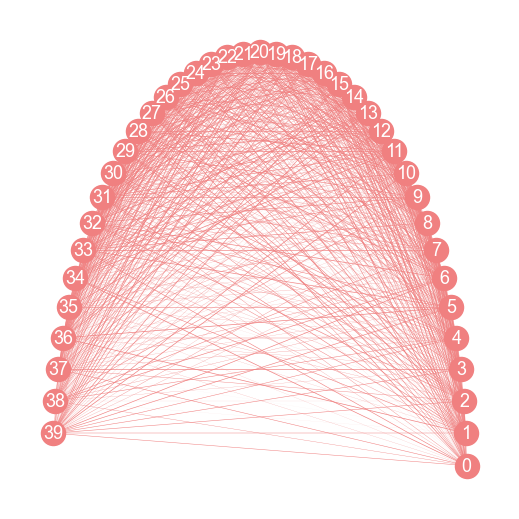

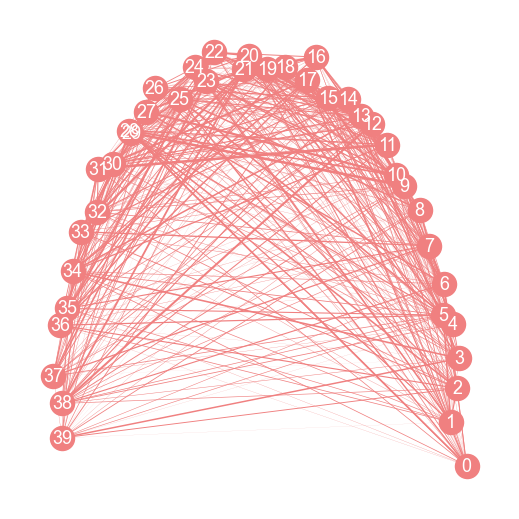

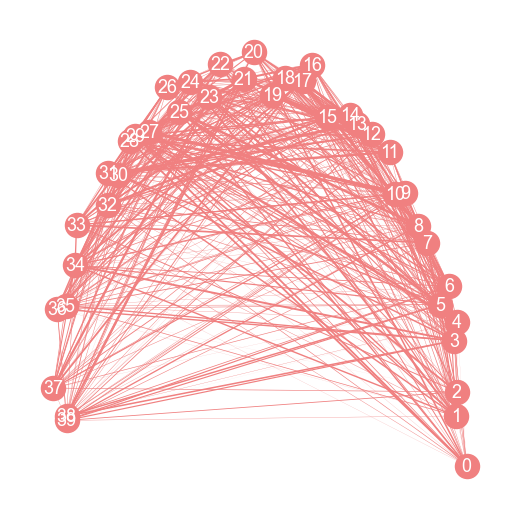

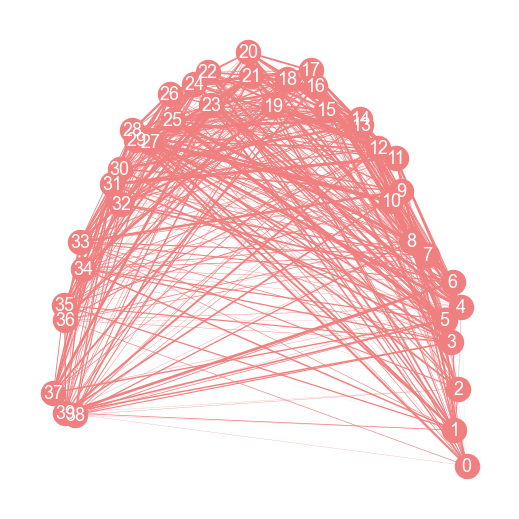

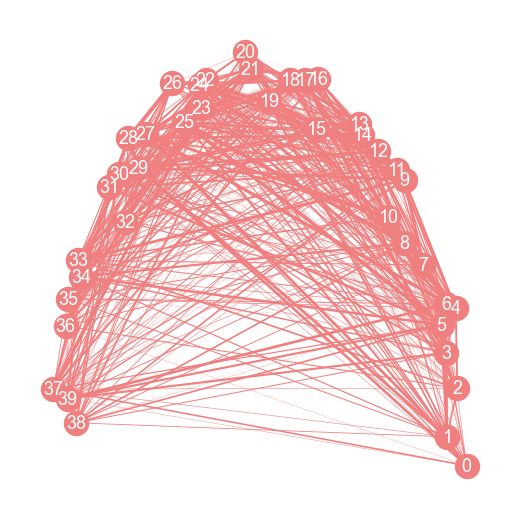

...

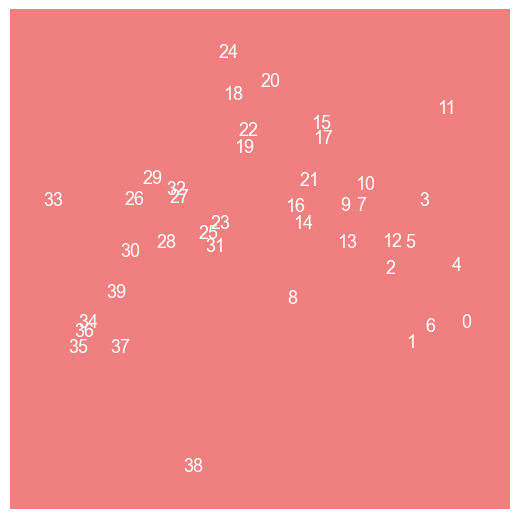

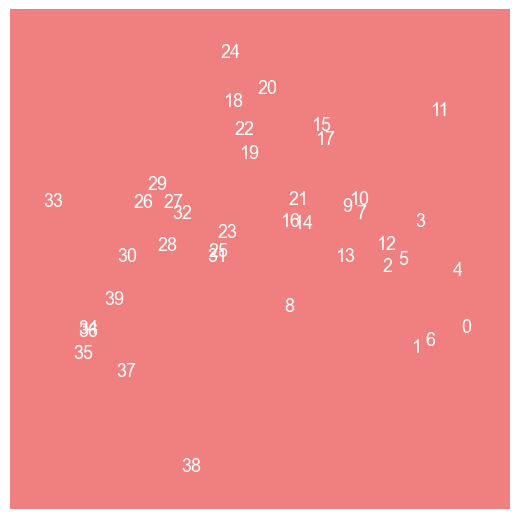

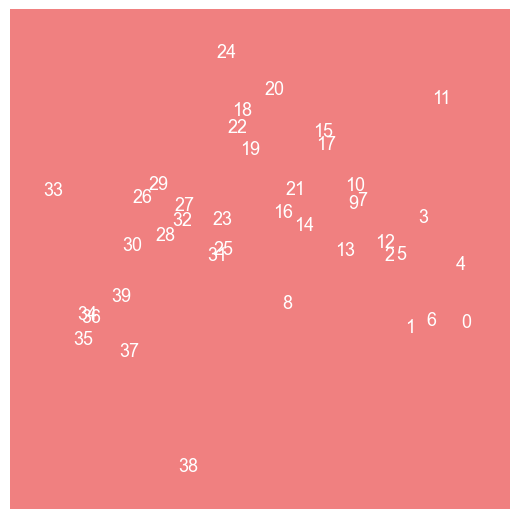

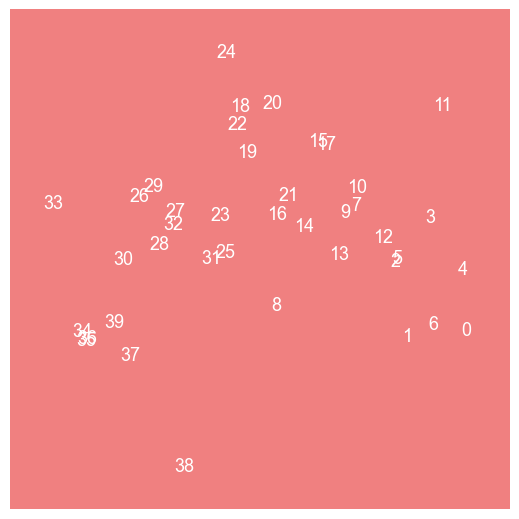

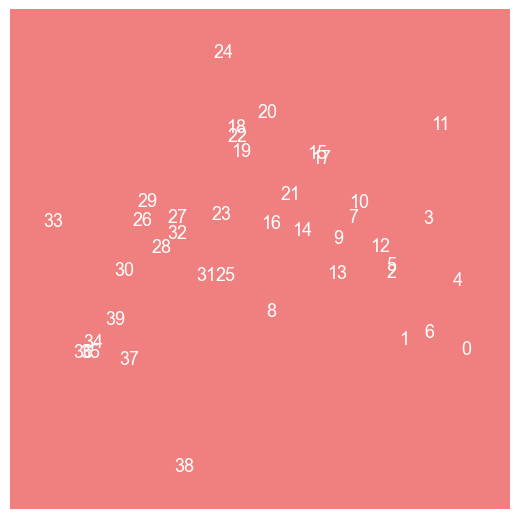

In [39]:
# system
for t in range(80):
    plt.figure(figsize=(5,5))
    GX=GXs[t].copy()
    pos=nx.get_node_attributes(GX, 'pos')
    labels=nx.get_node_attributes(GX, 'label')
    weight = nx.get_edge_attributes(GX, 'weight')
    wts=list(weight.values())
    min_wts=min(wts)
    wts=[abs(min_wts)+0.001+ele for ele in wts]
    wts = [i * 0.5 for i in wts]
    nx.draw(GX,pos=pos,width=wts,labels=labels, font_size=13, node_color='lightcoral',edge_color='lightcoral',font_color='white')

In [92]:
t

99

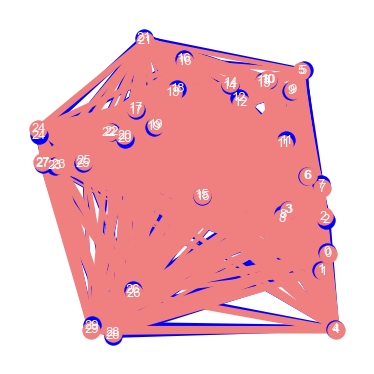

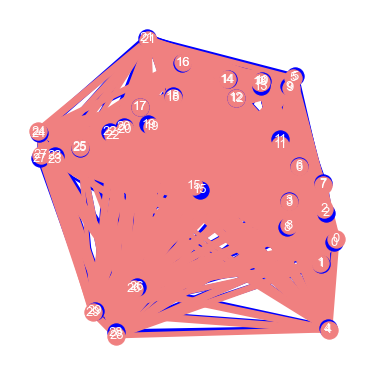

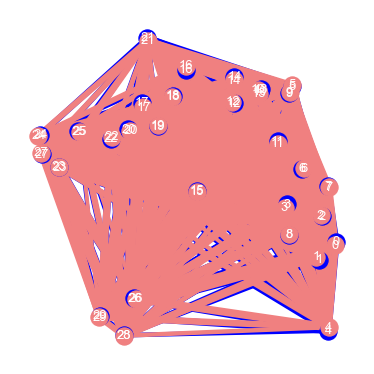

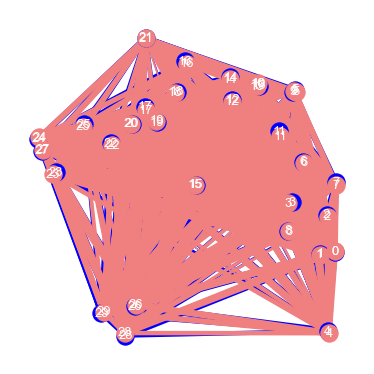

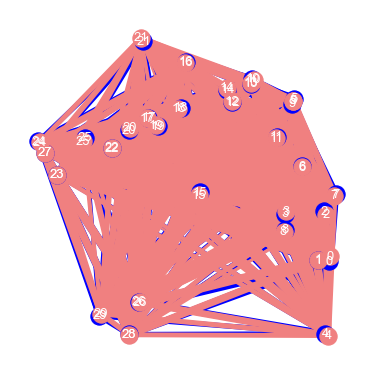

...

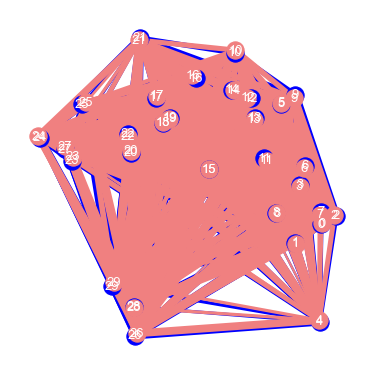

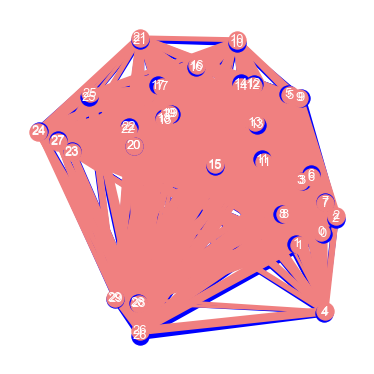

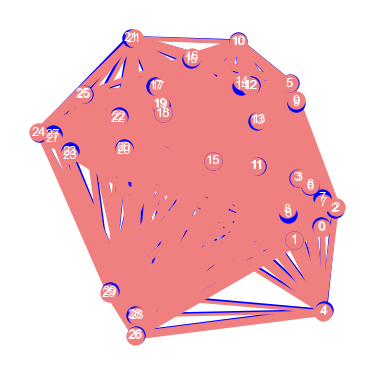

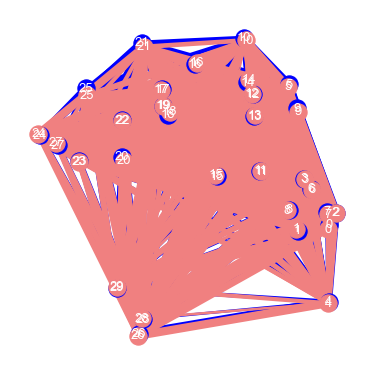

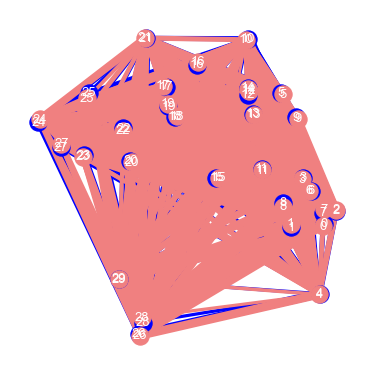

In [94]:
for t in range(80,100):
    plt.figure(figsize=(5,5))
    GXK=GXKs[t].copy()
    GX=GXs[t].copy()
    # Estimated
    pos=nx.get_node_attributes(GXK, 'pos')
    labels=nx.get_node_attributes(GXK, 'label')
    weight = nx.get_edge_attributes(GXK, 'weight')
    wts=list(weight.values())
    min_wts=min(wts)
    wts=[abs(min_wts)+0.001+ele for ele in wts]
    wts = [i * 0.5 for i in wts]
    nx.draw(GXK,pos=pos,width=wts,labels=labels, font_size=13, node_color='blue',edge_color='blue',font_color='white')


    # system
    pos=nx.get_node_attributes(GX, 'pos')
    labels=nx.get_node_attributes(GX, 'label')
    weight = nx.get_edge_attributes(GX, 'weight')
    wts=list(weight.values())
    min_wts=min(wts)
    wts=[abs(min_wts)+0.001+ele for ele in wts]
    wts = [i * 0.5 for i in wts]
    nx.draw(GX,pos=pos,width=wts,labels=labels, font_size=13, node_color='lightcoral',edge_color='lightcoral',font_color='white')

In [83]:
## create graph series for system and observed
GXs=[] #system
GYs=[] #obsereved
for tm in range(1,t+1):
    Xmat = np.zeros((N, N))
    Xmat[np.triu_indices(N, 1)] = X[:,tm].copy()
    Ymat = np.zeros((N, N))
    Ymat[np.triu_indices(N, 1)] = Y[:,tm].copy()
    Xmat= Xmat+ Xmat.T - np.diag(Xmat.diagonal())
    Ymat= Ymat+ Ymat.T - np.diag(Ymat.diagonal())
    
    GX = nx.from_numpy_matrix(Xmat)
    m=0
    for i in range(N):
        GX.nodes[i]['pos']=[X_nd[m,tm],X_nd[m+1,tm]]
        m=m+2
    null_nodes=[]
    for nd in GX.nodes:
        if GX.nodes[nd]['pos']==[0,0]:
            null_nodes.append(nd)
    GX.remove_nodes_from(null_nodes)
    GX=nx.relabel.convert_node_labels_to_integers(GX,first_label=0)
    labels={nn: str(nn) for nn in range(len(GX))}
    nx.set_node_attributes(GX, labels, 'label')  
    GXs.append(GX)
    
    GY = nx.from_numpy_matrix(Ymat)
    m=0
    f=0
    h=0
    for i in range(N):
        GY.nodes[i]['pos']=[Y_nd[m,tm],Y_nd[m+1,tm]]
        GY.nodes[i]['pos_feat']=list(YY_nd[f:f+2+feat_length,tm])
        GY.nodes[i]['feat']=list(feat_mat[h:h+feat_length,tm])
        f=f+2+feat_length
        m=m+2
        h=h+feat_length
    null_nodes=[]
    for nd in GY.nodes:
        if GY.nodes[nd]['pos']==[0,0]:
            null_nodes.append(nd)
    GY.remove_nodes_from(null_nodes)
    GY=nx.relabel.convert_node_labels_to_integers(GY,first_label=0)
    labels={nn: str(nn) for nn in range(len(GY))}
    nx.set_node_attributes(GY, labels, 'label')  
    GYs.append(GY)    

NameError: name 'YY_nd' is not defined

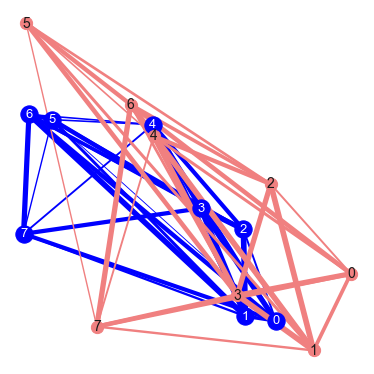

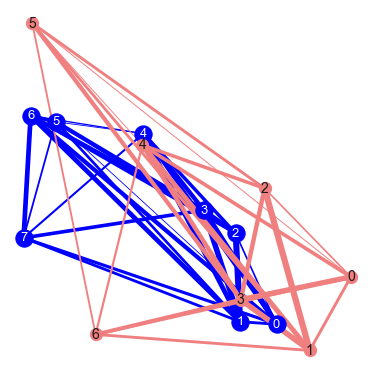

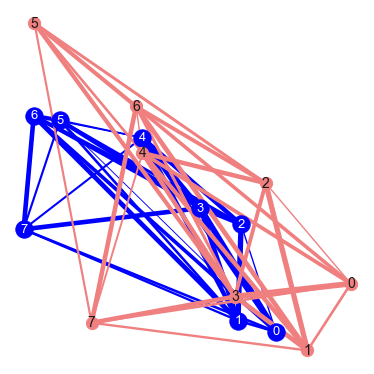

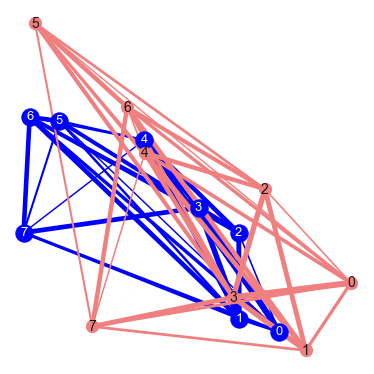

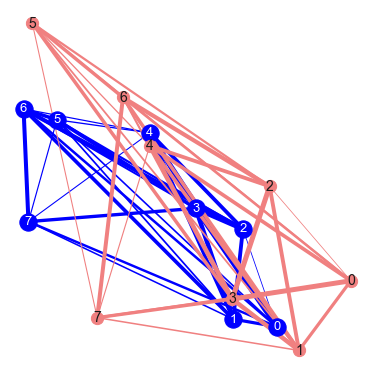

...

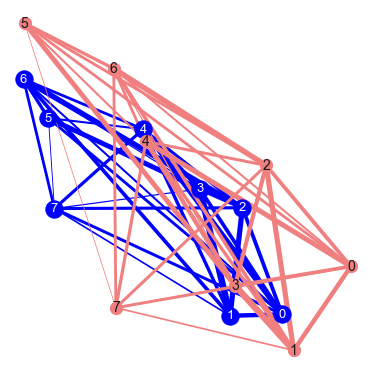

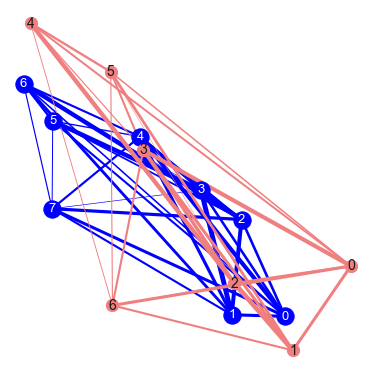

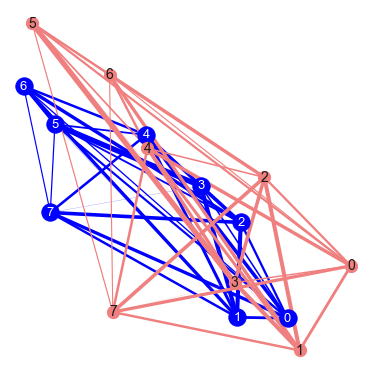

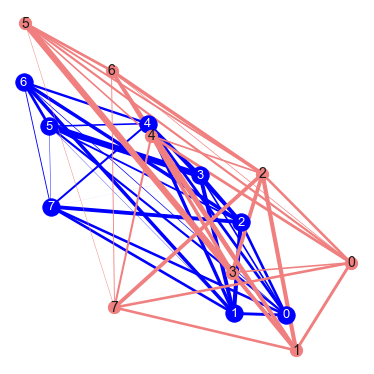

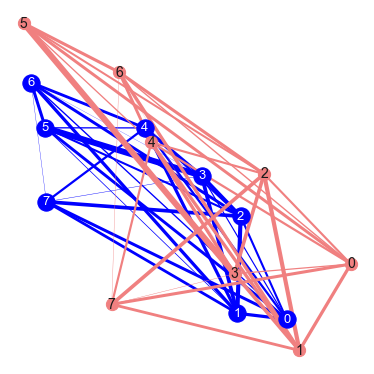

In [ ]:
# view some graphs in the series
for t in range(80,100):
    plt.figure(figsize=(5,5))
    GX=GXs[t].copy()
    GY=GYs[t].copy()

    # system
    pos=nx.get_node_attributes(GX, 'pos')
    labels=nx.get_node_attributes(GX, 'label')
    weight = nx.get_edge_attributes(GX, 'weight')
    wts=list(weight.values())
    min_wts=min(wts)
    wts=[abs(min_wts)+0.001+ele for ele in wts]
    wts = [i * 0.5 for i in wts]
    nx.draw(GX,pos=pos,width=wts,labels=labels, font_size=13, node_color='blue',edge_color='blue',font_color='white')

    #observed
    pos=nx.get_node_attributes(GY, 'pos')
    labels=nx.get_node_attributes(GY, 'label')
    weight = nx.get_edge_attributes(GY, 'weight')
    wts=list(weight.values())
    min_wts=min(wts)
    wts=[abs(min_wts)+0.001+ele for ele in wts]
    wts = [i * 0.5 for i in wts]
    for e in range(len(wts)):
        if abs(wts[e]-abs(min_wts)-0.001)<0.001:
            wts[e]=0
    nx.draw(GY,pos=pos,width=wts,labels=labels, font_size=14, node_color='lightcoral',edge_color='lightcoral',node_size=150)
